# Spatial-temporal analysis

In [1]:
import os
from pathlib import Path
from operator import itemgetter

import scanpy as sc
import numpy as np
import pandas as pd
import torch
from anndata import AnnData
from joblib import Parallel, delayed
from harmony import harmonize
import plotly.graph_objects as go

import scSLAT
from scSLAT.model import load_anndatas, Cal_Spatial_Net, run_SLAT, scanpy_workflow, spatial_match
from scSLAT.viz import match_3D_multi, hist, Sankey, match_3D_celltype, Sankey
from scSLAT.metrics import region_statistics

In [2]:
sc.set_figure_params(dpi=150, dpi_save=150)

In [11]:
adata1 = sc.read_h5ad('./adata1.h5ad')
adata2 = sc.read_h5ad('./adata2.h5ad')
print(f"adata1: {adata1.shape[0]} cells, adata2: {adata2.shape[0]} cells")

adata1: 10000 cells, adata2: 10001 cells


In [12]:
Cal_Spatial_Net(adata1, k_cutoff=50, model='KNN')
Cal_Spatial_Net(adata2, k_cutoff=50, model='KNN')
edges, features = load_anndatas([adata1, adata2], feature='Harmony',check_order=False)

Calculating spatial neighbour graph ...
The graph contains 500000 edges, 10000 cells.
50.0000 neighbors per cell on average.
Calculating spatial neighbour graph ...
The graph contains 500050 edges, 10001 cells.
50.0000 neighbors per cell on average.
Use Harmony feature to format graph


/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  view_to_actual(adata)


	Initialization is completed.
	Completed 1 / 30 iteration(s).
	Completed 2 / 30 iteration(s).
	Completed 3 / 30 iteration(s).
	Completed 4 / 30 iteration(s).
	Completed 5 / 30 iteration(s).
	Completed 6 / 30 iteration(s).
	Completed 7 / 30 iteration(s).
	Completed 8 / 30 iteration(s).
Reach convergence after 8 iteration(s).


# run Harmony 

In [19]:
best_harm, index_harm, distance_harm = spatial_match(features,smooth=False ,adatas=[adata1,adata2],reorder = False)

In [20]:
adata1_harm_df = pd.DataFrame({'index':range(features[0].shape[0]),
                          'x': adata1.obsm['spatial'][:,0],
                          'y': adata1.obsm['spatial'][:,1],
                          'celltype':adata1.obs['annotation']})
adata2_harm_df = pd.DataFrame({'index':range(features[1].shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'celltype':adata2.obs['annotation']})
matching_harm = np.array([range(index_harm.shape[0]), best_harm])
best_match_harm = distance_harm[:,0]
region_statistics(best_match_harm,start=0.5,number_of_interval=10)

0.500~0.550         8          0.040%
0.550~0.600        60          0.300%
0.600~0.650       198          0.990%
0.650~0.700       580          2.900%
0.700~0.750      1397          6.985%
0.750~0.800      2560         12.799%
0.800~0.850      3549         17.744%
0.850~0.900      4285         21.424%
0.900~0.950      4819         24.094%
0.950~1.000      2543         12.714%


/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/Dragon/viz/multi_dataset.py:231: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    All :29 celltypes; Overlap: 11 cell types 
                    Not ovelap :[['Inner ear', 'Spinal cord', 'Sclerotome', 'Branchial arch', 'Head mesenchyme', 'Dermomyotome', 'Surface ectoderm', 'Kidney', 'Muscle', 'Epidermis', 'Cartilage primordium', 'Choroid plexus', 'Pancreas', 'Mesentery', 'Sympathetic nerve', 'Ovary', 'Mucosal epithelium', 'Mesothelium']]
Just subsample 7999 cell pairs from 9999


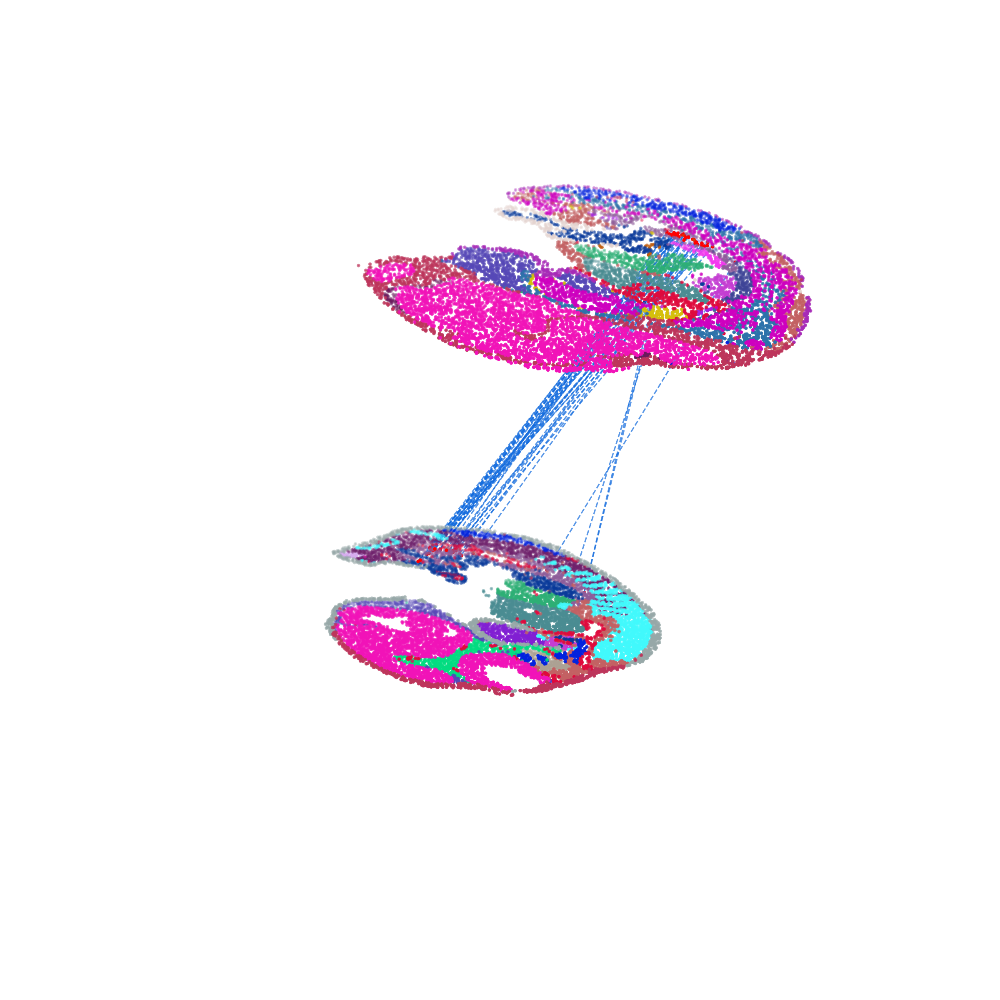

In [36]:
test = match_3D_celltype(adata1_harm_df, adata2_harm_df, matching_harm, meta='celltype', highlight_celltype = [['Urogenital ridge'],['Kidney']],
                         subsample_size=7999, highlight_cell = ['red'])
test.draw_3D(size= [10, 12],line_width =0.8,point_size=[1.2,1.2], hide_axis=True)

In [ ]:
adata_all = adata1.concatenate(adata2)
adata_all = scanpy_workflow(adata_all)

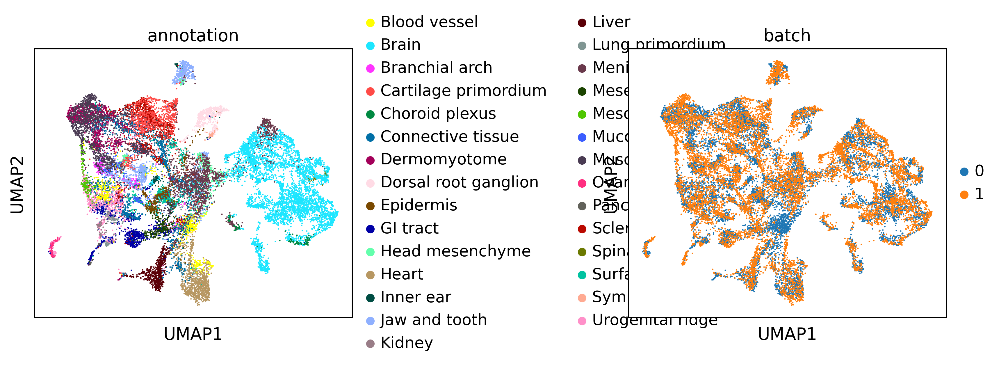

In [10]:
sc.pp.neighbors(adata_all, metric="cosine", use_rep='X_harmony',n_pcs=50)
sc.tl.umap(adata_all)
sc.pl.umap(adata_all, color=["annotation","batch"],wspace=0.7)

# run SLAT

In [13]:
embd0, embd1, time = run_SLAT(features, edges)

Choose GPU:6 as device
Running
---------- epochs: 1 ----------
---------- epochs: 2 ----------
---------- epochs: 3 ----------
---------- epochs: 4 ----------
---------- epochs: 5 ----------
---------- epochs: 6 ----------
---------- epochs: 7 ----------
Total Time 1.42


In [14]:
best, index, distance = spatial_match([embd0, embd1], reorder=False, adatas=[adata1,adata2])

Smoothing mapping, make sure object is in same direction


In [15]:
adata1_df = pd.DataFrame({'index':range(embd0.shape[0]),
                          'x': adata1.obsm['spatial'][:,0],
                          'y': adata1.obsm['spatial'][:,1],
                          'celltype':adata1.obs['annotation']})
adata2_df = pd.DataFrame({'index':range(embd1.shape[0]),
                          'x': adata2.obsm['spatial'][:,0],
                          'y': adata2.obsm['spatial'][:,1],
                          'celltype':adata2.obs['annotation']})
matching = np.array([range(index.shape[0]), best])
best_match = distance[:,0]
region_statistics(best_match,start=0,number_of_interval=20)

0.000~0.050         0          0.000%
0.050~0.100         0          0.000%
0.100~0.150         0          0.000%
0.150~0.200         0          0.000%
0.200~0.250         0          0.000%
0.250~0.300         0          0.000%
0.300~0.350         0          0.000%
0.350~0.400         0          0.000%
0.400~0.450         1          0.010%
0.450~0.500         6          0.060%
0.500~0.550        30          0.300%
0.550~0.600        68          0.680%
0.600~0.650       210          2.100%
0.650~0.700       466          4.660%
0.700~0.750       863          8.629%
0.750~0.800      1353         13.529%
0.800~0.850      1754         17.538%
0.850~0.900      2183         21.828%
0.900~0.950      2032         20.318%
0.950~1.000      1035         10.349%


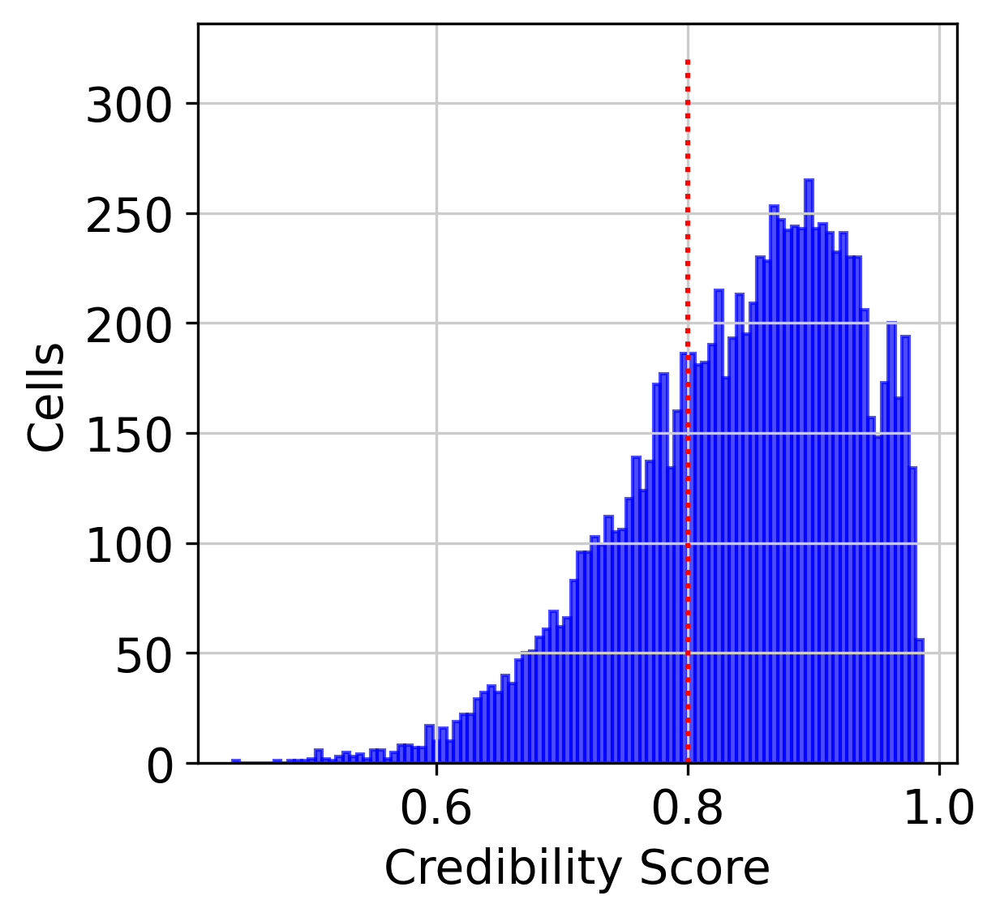

In [252]:
hist(best_match,cut=0.8,cut_height=320)

/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/Dragon/viz/multi_dataset.py:231: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    All :29 celltypes; Overlap: 11 cell types 
                    Not ovelap :[['Head mesenchyme', 'Branchial arch', 'Surface ectoderm', 'Inner ear', 'Dermomyotome', 'Spinal cord', 'Sclerotome', 'Epidermis', 'Muscle', 'Mucosal epithelium', 'Mesentery', 'Kidney', 'Cartilage primordium', 'Choroid plexus', 'Ovary', 'Mesothelium', 'Pancreas', 'Sympathetic nerve']]
Just subsample 300 cell pairs from 10001


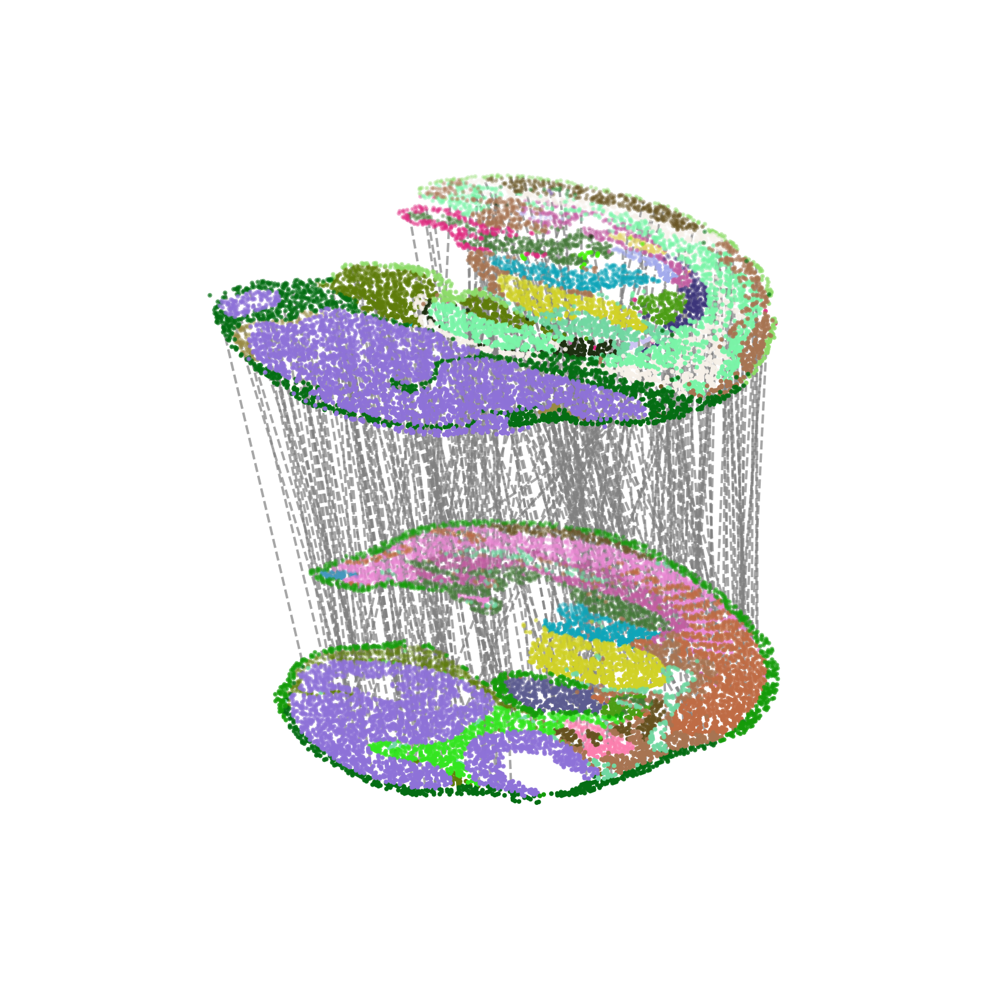

In [96]:
multi_align = match_3D_multi(adata1_df, adata2_df,matching,meta='celltype',
                             scale_coordinate=True,subsample_size=300,exchange_xy=False)

multi_align.draw_3D(size= [7, 8],line_width =1,point_size=[0.8,0.8], hide_axis=True,show_error=False)

In [58]:
adata2.obs['low_quality_index']= best_match 
adata2.obs['low_quality_index'] = adata2.obs['low_quality_index'].astype(float)

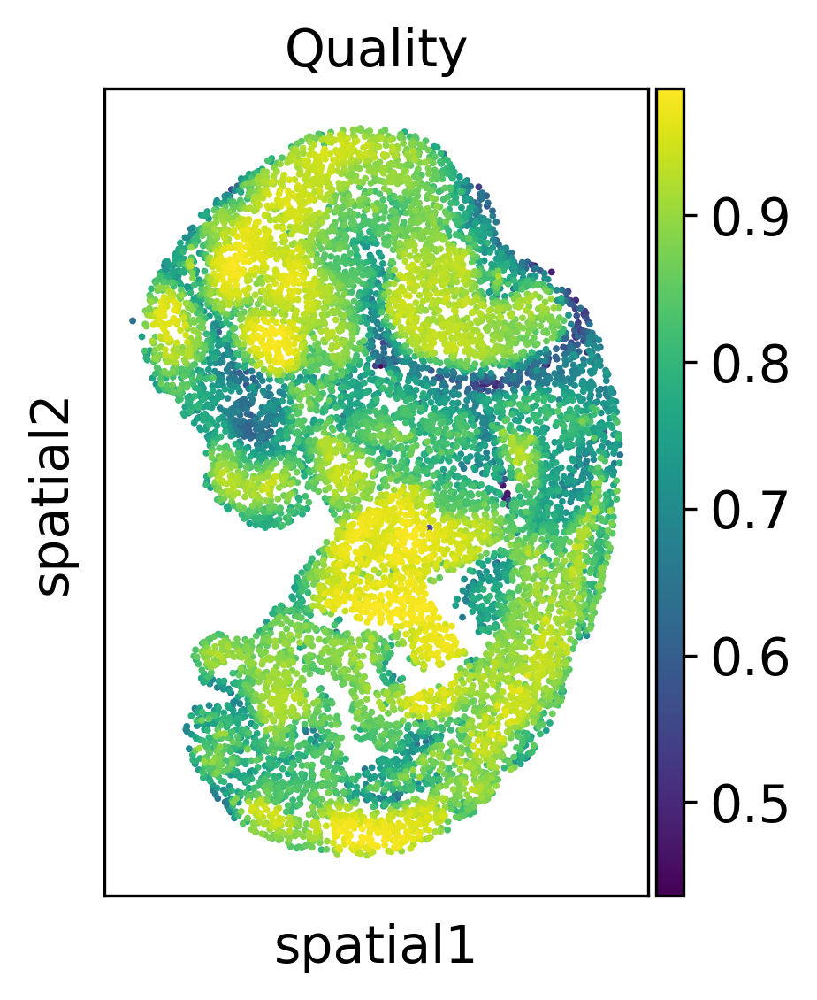

In [60]:
sc.pl.spatial(adata2, color='low_quality_index', spot_size=3, title='Quality')

In [239]:
adata2_df['target_celltype'] = adata1_df.iloc[matching[1,:],:]['celltype'].to_list()

In [240]:
matching_table = adata2_df.groupby(['celltype','target_celltype']).size().unstack(fill_value=0)

In [241]:
matching_table

target_celltype,Blood vessel,Brain,Branchial arch,Connective tissue,Dermomyotome,Dorsal root ganglion,GI tract,Head mesenchyme,Heart,Inner ear,Jaw and tooth,Liver,Lung primordium,Meninges,Sclerotome,Surface ectoderm,Urogenital ridge
celltype,,,,,,,,,,,,,,,,,
Blood vessel,1,0,5,166,12,0,1,0,75,0,0,3,3,0,2,5,2
Brain,0,2423,0,4,0,0,3,30,0,17,9,0,0,109,0,2,0
Cartilage primordium,0,0,4,14,63,0,0,79,0,0,11,0,13,0,525,52,15
Choroid plexus,0,75,0,0,0,0,0,0,0,0,1,0,0,32,0,1,0
Connective tissue,3,0,0,12,138,0,133,1,49,0,0,51,0,1,100,124,14
Dorsal root ganglion,0,0,0,2,0,232,0,0,0,0,0,0,0,2,19,35,1
Epidermis,1,0,41,10,1,7,0,0,0,0,10,0,0,1,4,237,0
GI tract,0,0,0,1,0,0,243,0,1,0,0,0,0,0,24,0,28
Heart,2,0,0,1,1,0,0,0,376,0,0,0,0,0,0,0,0


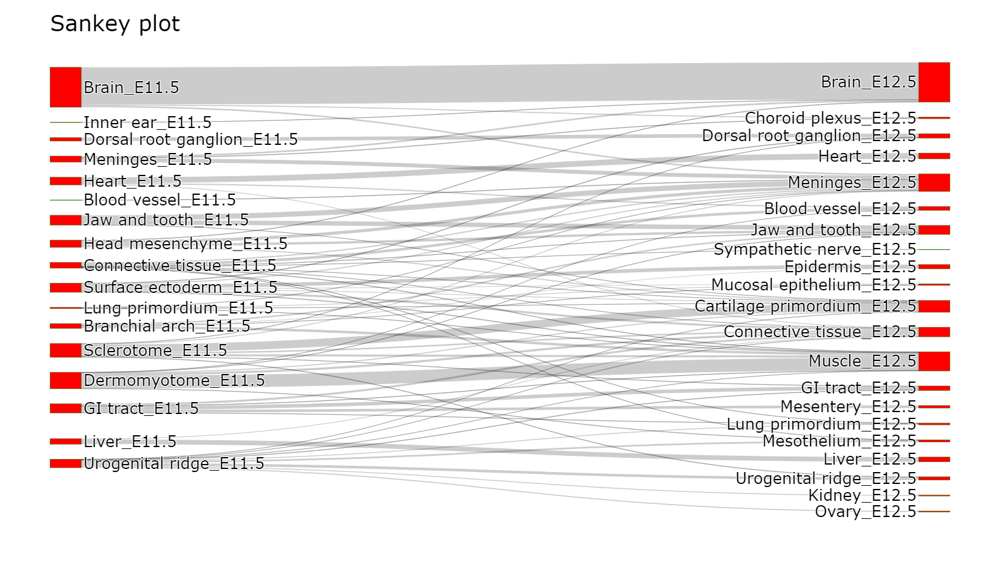

In [249]:
Sankey(matching_table)

# Kidney in development

In [166]:
kidney_prime = adata1[matching[1,adata2_df.loc[adata2_df.celltype=='Kidney','index'].values],:]
kidney = adata2[adata2.obs.annotation=='Kidney',:]

/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are 

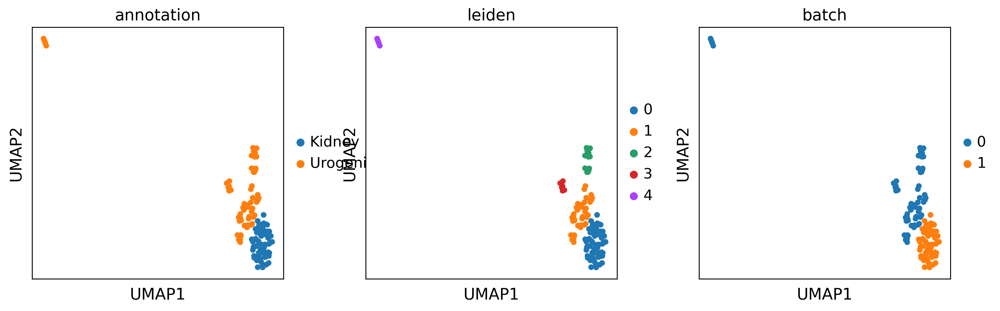

In [167]:
kidney_all = kidney_prime.concatenate(kidney)
kidney_all = scanpy_workflow(kidney_all)
sc.pp.neighbors(kidney_all, metric="cosine")
sc.tl.umap(kidney_all)
sc.tl.leiden(kidney_all, resolution=0.5)
sc.pl.umap(kidney_all, color=['annotation','leiden','batch'],size=100)

In [168]:
kidney_all.obs['re_anno'] = 'unknown'
kidney_all.obs.loc[kidney_all.obs.leiden=='4','re_anno'] = 'nephron progenitors'
kidney_all.obs.loc[kidney_all.obs.leiden=='1','re_anno'] = 'metanephron/mesonephron'
kidney_all.obs.loc[kidney_all.obs.leiden=='2','re_anno'] = 'metanephron progenitors'
kidney_all.obs.loc[kidney_all.obs.leiden=='0','re_anno'] = 'kidney'

/home/xiacr/.local/lib/python3.8/site-packages/pandas/core/generic.py:5604: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  self[name] = value
/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/contextlib.py:120: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


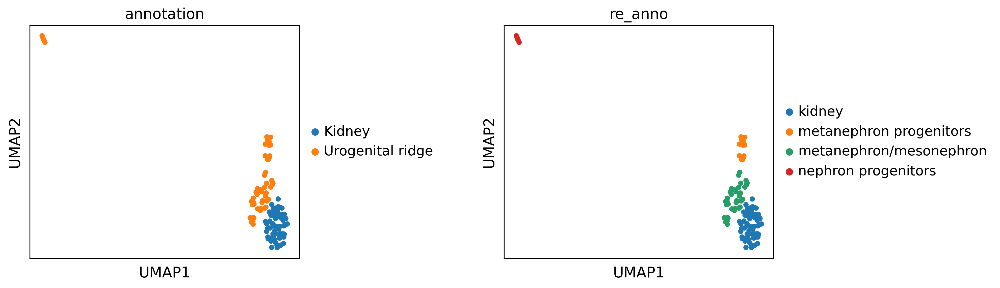

In [169]:
kidney_all = kidney_all[kidney_all.obs.leiden!='3',:]
kidney_all.obs.leiden = list(kidney_all.obs.leiden)
sc.pl.umap(kidney_all, color=['annotation', 're_anno'],size=100, ncols=2,wspace=0.6)

categories: kidney, metanephron progenitors, metanephron/mesonephron, etc.
var_group_labels: nephron progenitors, metanephric, kidney


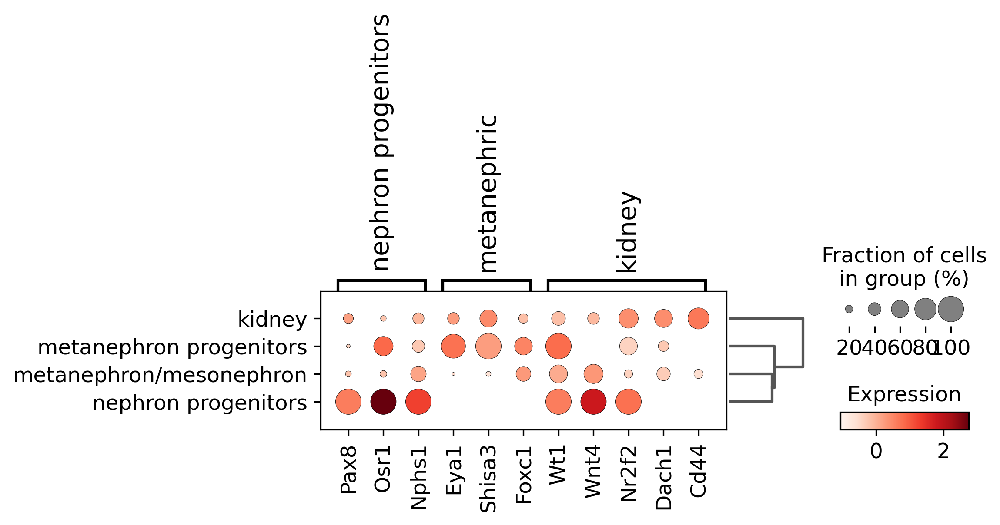

In [170]:
# Nphs1 https://www.nature.com/articles/s41467-021-22266-1
sc.pl.dotplot(kidney_all,{'nephron progenitors':['Pax8','Osr1','Nphs1'],
                         'metanephric':['Eya1','Shisa3','Foxc1'], 
                         'kidney':['Wt1','Wnt4','Nr2f2','Dach1','Cd44']} ,
              're_anno',dendrogram=True,colorbar_title='Expression')

In [222]:
kidney_1 = kidney_all.obs.loc[kidney_all.obs.batch=='0','re_anno']
kidney_1.index = [x.replace('-0','') for x in kidney_1.index]
kidney_1 = kidney_1[~kidney_1.index.duplicated(keep="first")]
kidney_1 = kidney_1.to_frame()
kidney_1.columns = ['kidney_anno']
kidney_1.kidney_anno = kidney_1.kidney_anno.to_list()

In [223]:
# adata1.obs['kidney_anno'] = 'Other'
adata1.obs = adata1.obs.merge(kidney_1, how='left',left_index=True, right_index=True)

In [232]:
adata1.obs.kidney_anno = adata1.obs.kidney_anno.to_list()

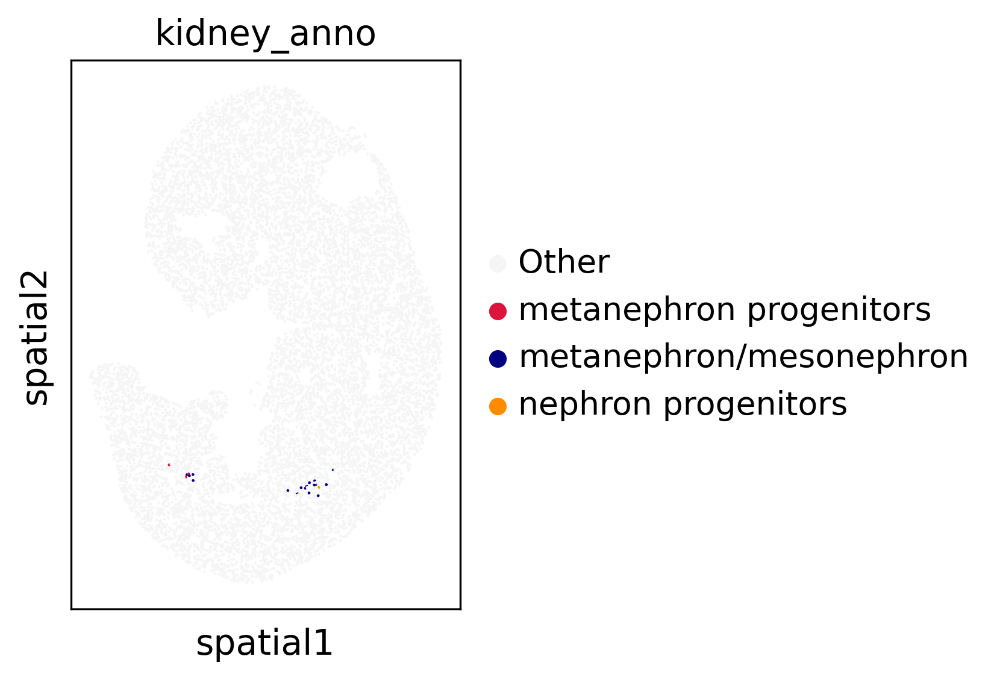

In [234]:
adata1.obs.kidney_anno = adata1.obs.kidney_anno.fillna('Other')
sc.pl.spatial(adata1, color=['kidney_anno'], spot_size=1.5, palette=['#F5F5F5','#DC143C','#000080','#FF8C00','#800000'])

/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/Dragon/viz/multi_dataset.py:231: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    All :29 celltypes; Overlap: 11 cell types 
                    Not ovelap :[['Head mesenchyme', 'Branchial arch', 'Surface ectoderm', 'Inner ear', 'Dermomyotome', 'Spinal cord', 'Sclerotome', 'Epidermis', 'Muscle', 'Mucosal epithelium', 'Mesentery', 'Kidney', 'Cartilage primordium', 'Choroid plexus', 'Ovary', 'Mesothelium', 'Pancreas', 'Sympathetic nerve']]
Just subsample 10000 cell pairs from 10001


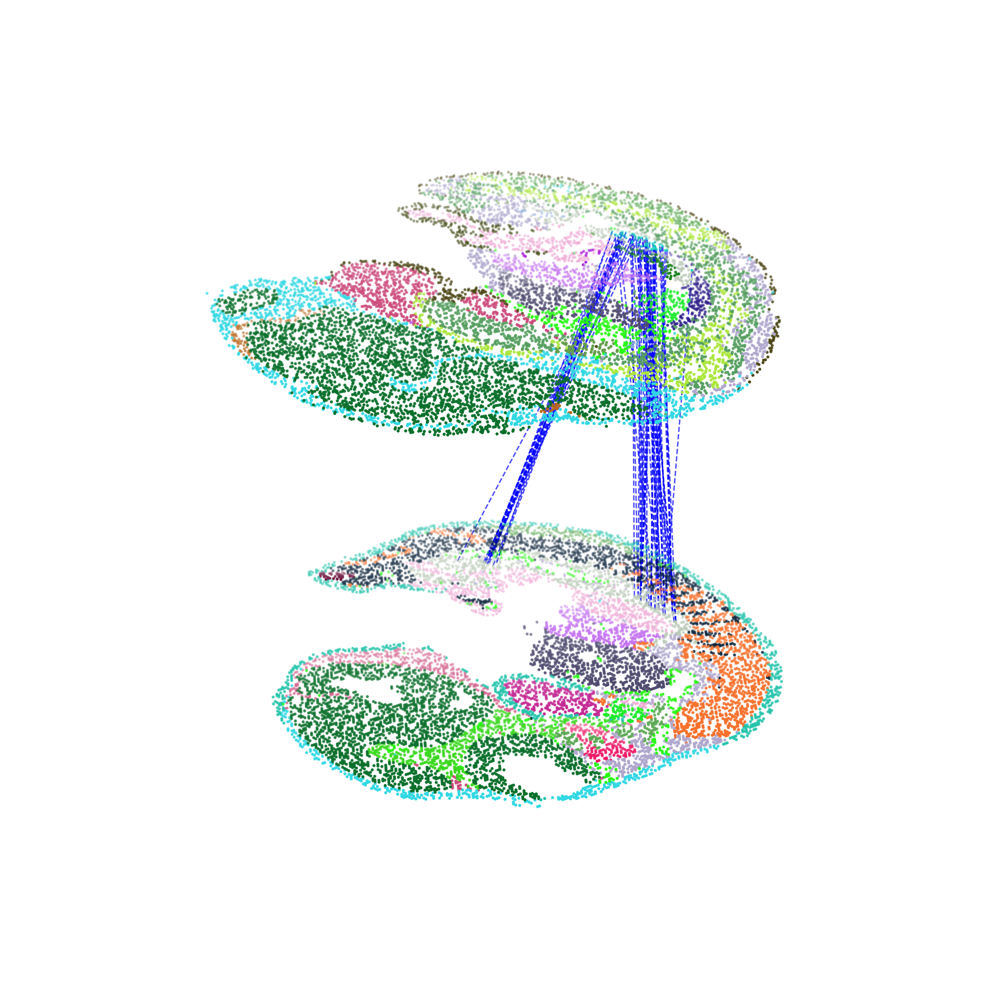

In [90]:
test = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['Urogenital ridge'],['Kidney']],subsample_size=10000, highlight_line = ['blue'],scale_coordinate = True )
test.draw_3D(size= [10, 12],line_width =0.8,point_size=[0.6,0.6], hide_axis=True)

# Ovary in development

/rd2/user/xiacr/spatialGLUE/conda/lib/python3.8/site-packages/Dragon/viz/multi_dataset.py:231: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



dataset1: 18 cell types; dataset2: 22 cell types; 
                    All :29 celltypes; Overlap: 11 cell types 
                    Not ovelap :[['Head mesenchyme', 'Branchial arch', 'Surface ectoderm', 'Inner ear', 'Dermomyotome', 'Spinal cord', 'Sclerotome', 'Epidermis', 'Muscle', 'Mucosal epithelium', 'Mesentery', 'Kidney', 'Cartilage primordium', 'Choroid plexus', 'Ovary', 'Mesothelium', 'Pancreas', 'Sympathetic nerve']]
Just subsample 10000 cell pairs from 10001


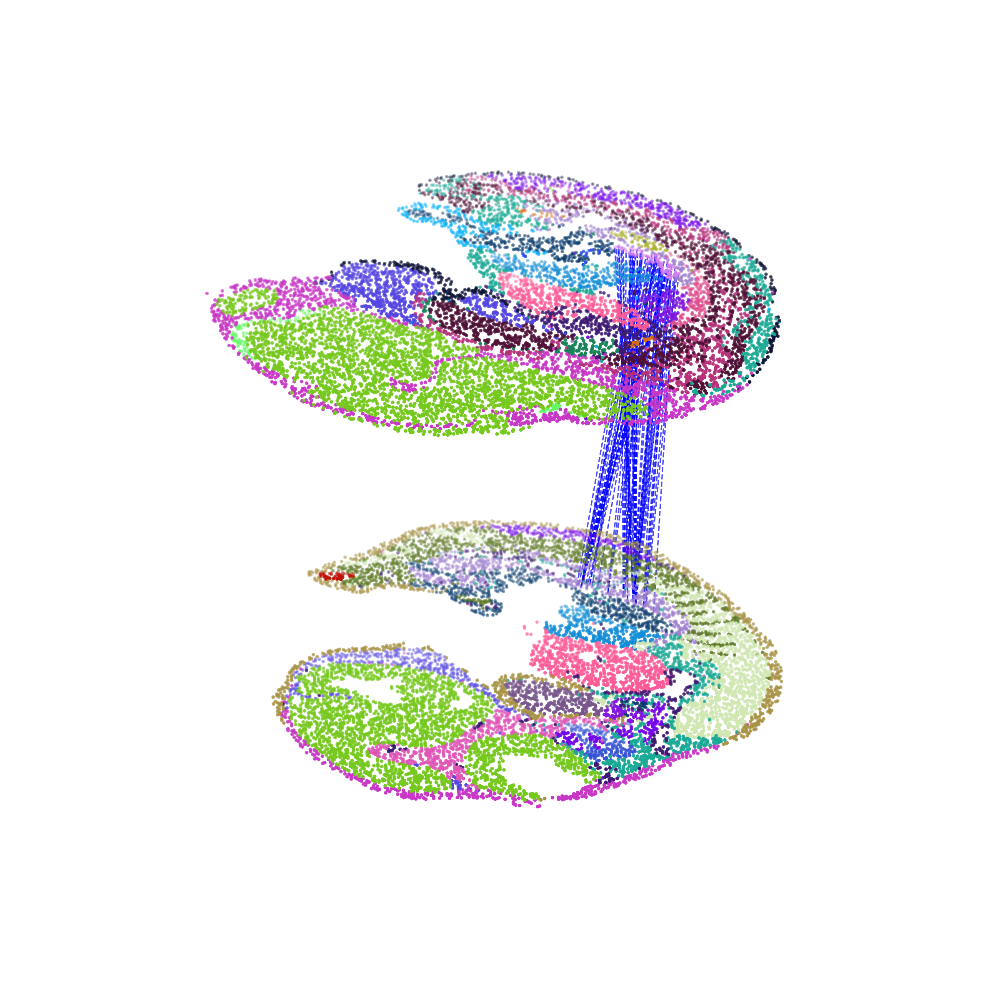

In [95]:
test = match_3D_celltype(adata1_df, adata2_df, matching, meta='celltype', highlight_celltype = [['Urogenital ridge'],['Ovary']],subsample_size=10000, highlight_line = ['blue'],scale_coordinate = True)
test.draw_3D(size= [10, 12],line_width =0.8,point_size=[1.2,1.2], hide_axis=True)

# Highlight lung

In [149]:
adata1.obs['is_lung'] = 'Other'
adata2.obs['is_lung'] = 'Other'
adata1.obs.loc[adata1.obs.annotation=='Heart','is_lung'] = 'Heart'
adata2.obs.loc[adata2.obs.annotation=='Heart','is_lung'] = 'Heart'
adata1.obs.loc[adata1.obs.annotation=='Lung primordium','is_lung'] = 'Lung primordium'
adata2.obs.loc[adata2.obs.annotation=='Lung primordium','is_lung'] = 'Lung primordium'


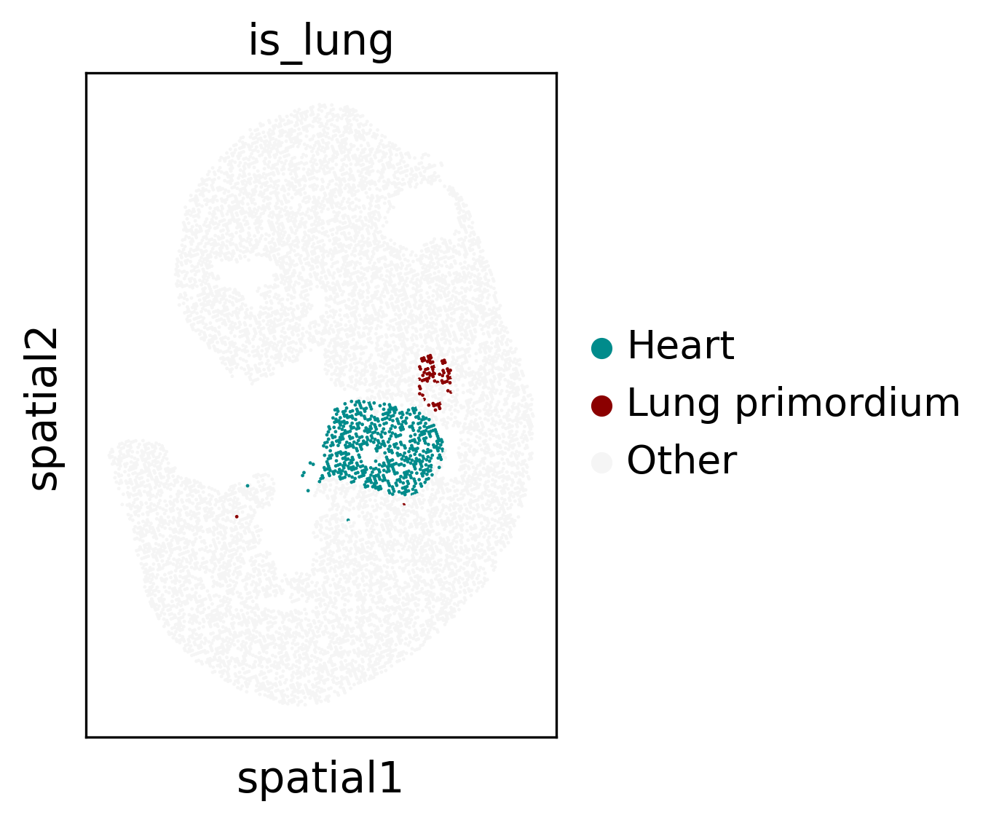

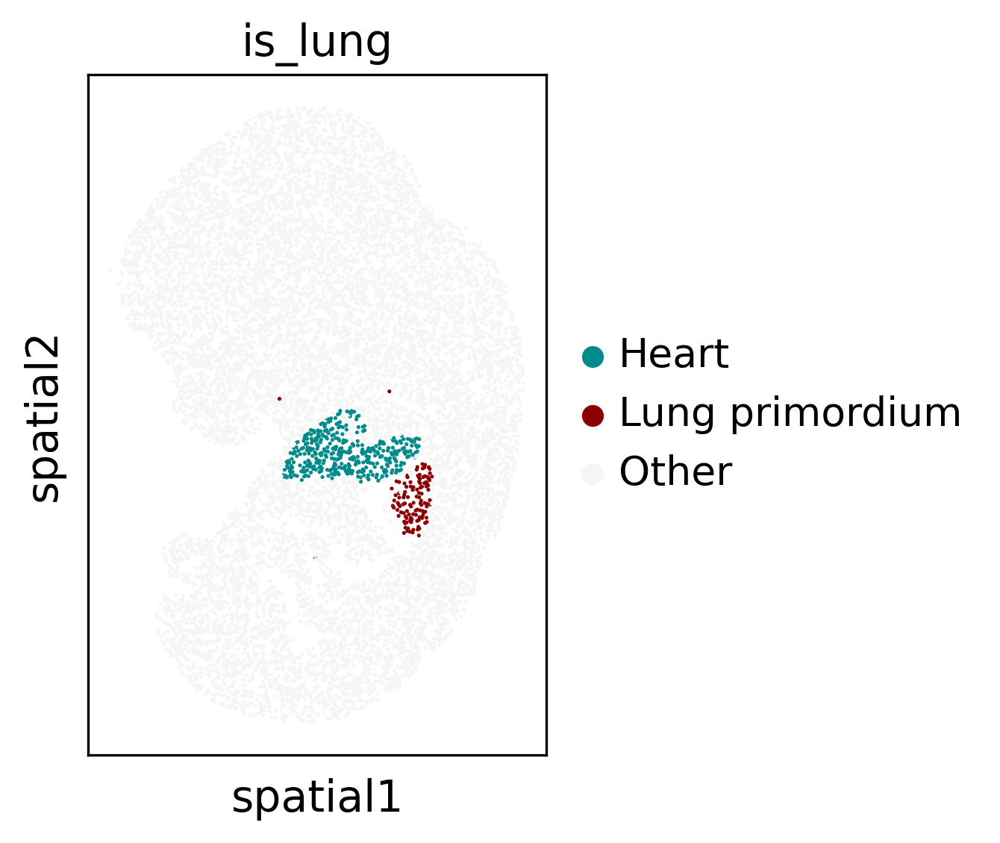

In [163]:
sc.pl.spatial(adata1, color=['is_lung'], spot_size=1.5, palette=['#008B8B','#8B0000','#F5F5F5'])
sc.pl.spatial(adata2, color=['is_lung'], spot_size=2, palette =['#008B8B','#8B0000','#F5F5F5'])

# Save data

In [88]:
adata1.write_h5ad('./adata1_processed.h5ad')
adata2.write_h5ad('./adata2_processed.h5ad')